In [1]:
import pandas as pd
import numpy as np
import sys
import matplotlib.pyplot as plt
%matplotlib inline
sys.path.insert(0,'..')
%load_ext autoreload
%autoreload 2

In [2]:
from generate_segment_trajectories import GenerateSegmentTrajectories, get_agent_ids,get_max_frame_value, get_basic_dataframe

In [3]:
normal = get_basic_dataframe(rounds=["round_0"],agent_map_folder="../agent_maps", max_agents=150)

In [4]:
anomalous = get_basic_dataframe(rounds=["debris_round2"],agent_map_folder="../agent_maps", max_agents=150)

In [5]:
print(len(anomalous))
anomalous = pd.concat(anomalous)

150


In [6]:
normal = pd.concat(normal)

In [7]:
normal

,frame_id,round_id,ego_agent_id,num_vehicles,max_velocity_x,max_velocity_y,max_velocity_z,max_ang_velocity_x,max_ang_velocity_y,max_ang_velocity_z,...,min_velocity_z,min_ang_velocity_x,min_ang_velocity_y,min_ang_velocity_z,max_acc_x,max_acc_y,max_acc_z,min_acc_x,min_acc_y,min_acc_z
0,0,round_0,4,256,0.000000e+00,3.084760e-09,0.000000e+00,2.445680e-07,0.000000,4.681375e-09,...,-7.399784e-01,0.000000,-0.000092,0.000000e+00,0.000000e+00,1.542380e-08,1.197348e+00,-6.124340e-06,0.000000e+00,0.000000e+00
1,1,round_0,4,256,0.000000e+00,0.000000e+00,0.000000e+00,1.746167e-06,0.000000,1.695121e-09,...,-2.224330e-01,0.000000,-0.000024,0.000000e+00,4.953917e-06,0.000000e+00,2.587727e+00,0.000000e+00,-6.383999e-08,0.000000e+00
2,2,round_0,4,256,0.000000e+00,0.000000e+00,0.000000e+00,1.626218e-06,0.000000,0.000000e+00,...,-3.532698e-02,0.000000,-0.000019,-9.136873e-09,0.000000e+00,3.802652e-09,9.355304e-01,-1.129266e-09,0.000000e+00,0.000000e+00
3,3,round_0,4,256,0.000000e+00,0.000000e+00,2.128191e-02,1.586013e-06,0.000000,0.000000e+00,...,0.000000e+00,0.000000,-0.000008,-1.514204e-08,5.188388e-07,2.903899e-11,2.830445e-01,0.000000e+00,0.000000e+00,0.000000e+00
4,4,round_0,4,256,4.946637e-07,0.000000e+00,3.058315e-02,2.443242e-06,0.000030,5.084025e-10,...,0.000000e+00,0.000000,0.000000,0.000000e+00,3.126032e-06,0.000000e+00,4.650619e-02,0.000000e+00,-3.747848e-08,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,795,round_0,1,258,1.240724e-01,-5.131138e+00,-6.483905e-07,-3.966877e-03,-0.004138,-2.470238e+00,...,-6.483905e-07,-0.003967,-0.004138,-2.470238e+00,-1.135681e-02,-2.717972e-04,-1.001191e-05,-1.135681e-02,-2.717972e-04,-1.001191e-05
21,796,round_0,1,258,1.219556e-01,-5.131191e+00,-6.483905e-07,-3.984698e-03,-0.004725,-2.456002e+00,...,-6.483905e-07,-0.003985,-0.004725,-2.456002e+00,-1.058400e-02,-2.622604e-04,0.000000e+00,-1.058400e-02,-2.622604e-04,0.000000e+00
22,797,round_0,1,258,1.199574e-01,-5.131240e+00,2.154945e-06,-4.013023e-03,-0.004700,-2.441845e+00,...,2.154945e-06,-0.004013,-0.004700,-2.441845e+00,-9.991080e-03,-2.455711e-04,1.401668e-05,-9.991080e-03,-2.455711e-04,1.401668e-05
23,798,round_0,1,258,1.180870e-01,-5.131287e+00,-5.911795e-07,-4.023038e-03,-0.004735,-2.427667e+00,...,-5.911795e-07,-0.004023,-0.004735,-2.427667e+00,-9.351932e-03,-2.336502e-04,-1.373062e-05,-9.351932e-03,-2.336502e-04,-1.373062e-05


In [8]:
anomalous

,frame_id,round_id,ego_agent_id,num_vehicles,max_velocity_x,max_velocity_y,max_velocity_z,max_ang_velocity_x,max_ang_velocity_y,max_ang_velocity_z,...,min_velocity_z,min_ang_velocity_x,min_ang_velocity_y,min_ang_velocity_z,max_acc_x,max_acc_y,max_acc_z,min_acc_x,min_acc_y,min_acc_z
0,0,debris_round2,4,305,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,-0.489837,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,-9.796735
1,1,debris_round2,4,305,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,-0.979429,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,-9.791836
2,2,debris_round2,4,305,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,-1.468776,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,-9.786944
3,3,debris_round2,4,305,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,-1.957878,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,-9.782043
4,4,debris_round2,4,305,0.0,5.599654e-08,0.0,0.0,0.0,0.0,...,-1.283988,-0.000006,-9.210367e-07,-1.076592e-09,0.0,0.000001,13.477802,-9.287096e-08,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,295,debris_round2,4,323,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,0.000000
21,296,debris_round2,4,323,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,0.000000
22,297,debris_round2,4,323,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,0.000000
23,298,debris_round2,4,323,0.0,0.000000e+00,0.0,0.0,0.0,0.0,...,0.000000,0.000000,0.000000e+00,0.000000e+00,0.0,0.000000,0.000000,0.000000e+00,0.0,0.000000


# Train and test the Random forest model

In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

In [10]:
# useful_cols = ["num_vehicles", "max_velocity_x", "max_velocity_y", 
#         "max_velocity_z", "max_ang_velocity_x", "max_ang_velocity_y", "max_ang_velocity_z", "min_velocity_x", 
#         "min_velocity_y", "min_velocity_z", "min_ang_velocity_x", "min_ang_velocity_y", "min_ang_velocity_z", 
#         "max_acc_x", "max_acc_y", "max_acc_z", "min_acc_x","min_acc_y","min_acc_z"]
useful_cols = ["max_velocity_x", "max_velocity_y", 
        "max_velocity_z", "max_ang_velocity_x", "max_ang_velocity_y", "max_ang_velocity_z", "min_velocity_x", 
        "min_velocity_y", "min_velocity_z", "min_ang_velocity_x", "min_ang_velocity_y", "min_ang_velocity_z", 
        "max_acc_x", "max_acc_y", "max_acc_z", "min_acc_x","min_acc_y","min_acc_z"]

X = pd.concat([normal[useful_cols],anomalous[useful_cols]])
y = np.hstack([np.zeros(normal.shape[0]),np.ones(anomalous.shape[0])])

In [11]:
X.shape, y.shape

((7500, 18), (7500,))

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((5250, 18), (2250, 18), (5250,), (2250,))

In [13]:
RF = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)

In [14]:
RF_res = RF.fit(X_train, y_train)
RF_res.predict(X_test)
round(RF_res.score(X_test, y_test), 4)

0.9862

In [15]:
RF_res.score(X_test, y_test)

0.9862222222222222

In [16]:
# X_test

In [17]:
from sklearn.neural_network import MLPClassifier
NN = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(150, 10), random_state=1).fit(X_train, y_train)
NN.predict(X_test)
round(NN.score(X_test, y_test), 4)

/home/tarang/anaconda3/envs/argoverse/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


0.8769

# Visualize one of the Random forest Trees

In [18]:
# Extract single tree
estimator = RF_res.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = ["Normal","Anomalous"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

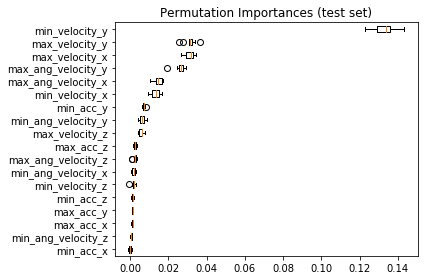

In [19]:
from sklearn.inspection import permutation_importance
result = permutation_importance(RF, X_test, y_test, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

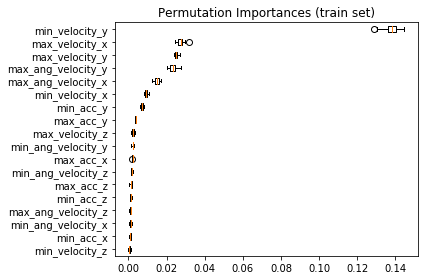

In [20]:
result = permutation_importance(RF, X_train, y_train, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (train set)")
fig.tight_layout()
plt.show()

# With one random Column

In [34]:
# useful_cols = ["num_vehicles", "max_velocity_x", "max_velocity_y", 
#         "max_velocity_z", "max_ang_velocity_x", "max_ang_velocity_y", "max_ang_velocity_z", "min_velocity_x", 
#         "min_velocity_y", "min_velocity_z", "min_ang_velocity_x", "min_ang_velocity_y", "min_ang_velocity_z", 
#         "max_acc_x", "max_acc_y", "max_acc_z", "min_acc_x","min_acc_y","min_acc_z"]
useful_cols = ["max_velocity_x", "max_velocity_y", 
        "max_velocity_z", "max_ang_velocity_x", "max_ang_velocity_y", "max_ang_velocity_z", "min_velocity_x", 
        "min_velocity_y", "min_velocity_z", "min_ang_velocity_x", "min_ang_velocity_y", "min_ang_velocity_z", 
        "max_acc_x", "max_acc_y", "max_acc_z", "min_acc_x","min_acc_y","min_acc_z"]

X = pd.concat([normal[useful_cols],anomalous[useful_cols]])
y = np.hstack([np.zeros(normal.shape[0]),np.ones(anomalous.shape[0])])

In [35]:
# INSERT RANDOM COLUMN Here
X["random_col"]=X['max_velocity_x'].copy()

In [36]:
np.random.shuffle(X["random_col"].values)
X.shape, y.shape

((7500, 19), (7500,))

In [38]:
X

,max_velocity_x,max_velocity_y,max_velocity_z,max_ang_velocity_x,max_ang_velocity_y,max_ang_velocity_z,min_velocity_x,min_velocity_y,min_velocity_z,min_ang_velocity_x,min_ang_velocity_y,min_ang_velocity_z,max_acc_x,max_acc_y,max_acc_z,min_acc_x,min_acc_y,min_acc_z,random_col
0,0.000000e+00,3.084760e-09,0.000000,2.445680e-07,0.00000,4.681375e-09,-1.224868e-06,0.000000e+00,-0.739978,0.0,-0.000092,0.000000e+00,0.000000e+00,1.542380e-08,1.197348,-6.124340e-06,0.000000e+00,0.0,0.046319
1,0.000000e+00,0.000000e+00,0.000000,1.746167e-06,0.00000,1.695121e-09,-2.340846e-07,-9.683237e-09,-0.222433,0.0,-0.000024,0.000000e+00,4.953917e-06,0.000000e+00,2.587727,0.000000e+00,-6.383999e-08,0.0,1.700077
2,0.000000e+00,0.000000e+00,0.000000,1.626218e-06,0.00000,0.000000e+00,-2.343104e-07,-8.922707e-09,-0.035327,0.0,-0.000019,-9.136873e-09,0.000000e+00,3.802652e-09,0.935530,-1.129266e-09,0.000000e+00,0.0,0.000000
3,0.000000e+00,0.000000e+00,0.021282,1.586013e-06,0.00000,0.000000e+00,-1.305427e-07,-8.916899e-09,0.000000,0.0,-0.000008,-1.514204e-08,5.188388e-07,2.903899e-11,0.283044,0.000000e+00,0.000000e+00,0.0,0.000000
4,4.946637e-07,0.000000e+00,0.030583,2.443242e-06,0.00003,5.084025e-10,0.000000e+00,-1.641260e-08,0.000000,0.0,0.000000,0.000000e+00,3.126032e-06,0.000000e+00,0.046506,0.000000e+00,-3.747848e-08,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.0,6.139258
21,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.0,0.085932
22,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.0,0.004628
23,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.00000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.0,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000e+00,0.000000e+00,0.0,2.223567


In [39]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape 

((5250, 19), (2250, 19), (5250,), (2250,))

In [40]:
RF = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)

In [41]:
RF_res = RF.fit(X_train, y_train)
RF_res.predict(X_test)
round(RF_res.score(X_test, y_test), 4)

0.9867

In [42]:
RF_res.score(X_test, y_test)

0.9866666666666667

In [43]:
# X_test

In [44]:
from sklearn.neural_network import MLPClassifier
NN = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(150, 10), random_state=1).fit(X_train, y_train)
NN.predict(X_test)
round(NN.score(X_test, y_test), 4)

/home/tarang/anaconda3/envs/argoverse/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


0.8742

In [45]:
# Extract single tree
estimator = RF_res.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree2.dot', 
                feature_names = X_train.columns,
                class_names = ["Normal","Anomalous"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree2.dot', '-o', 'tree2.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree2.png')

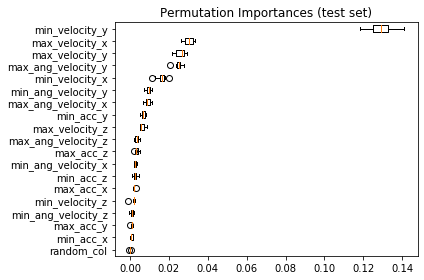

In [46]:
from sklearn.inspection import permutation_importance
result = permutation_importance(RF, X_test, y_test, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

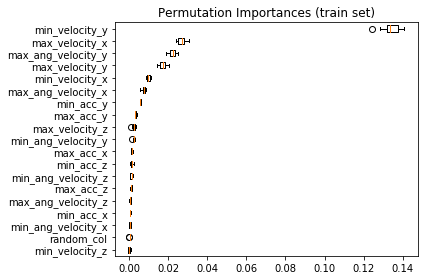

In [47]:
result = permutation_importance(RF, X_train, y_train, n_repeats=10,
                                random_state=42, n_jobs=2)
sorted_idx = result.importances_mean.argsort()

fig, ax = plt.subplots()
ax.boxplot(result.importances[sorted_idx].T,
           vert=False, labels=X_test.columns[sorted_idx])
ax.set_title("Permutation Importances (train set)")
fig.tight_layout()
plt.show()